## Student Name: Lim Zhao Hong Student ID: 20065320

### Mounting of Google Drive

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
DataFolder = "/content/drive/MyDrive/SDAAI/TA1-1-C3849C-A-Computer-Vision/CWF"

### Install the dependencies

In [3]:
!pip install opencv-python

import cv2
%matplotlib inline
from matplotlib import pyplot as plt
from IPython.display import clear_output
from time import sleep
from tqdm import tqdm

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


### Import necessary libraries

In [4]:
import cv2
%matplotlib inline
from matplotlib import pyplot as plt
from IPython.display import clear_output
from time import sleep
from tqdm import tqdm



### Function to play mp4

In [5]:
def show_local_mp4_video(file_name, width=640, height=480):
  import io
  import base64
  from IPython.display import HTML
  video_encoded = base64.b64encode(io.open(file_name, 'rb').read())
  return HTML(data='''<video width="{0}" height="{1}" alt="test" controls>
                        <source src="data:video/mp4;base64,{2}" type="video/mp4" />
                      </video>'''.format(width, height, video_encoded.decode('ascii')))

In [6]:
show_local_mp4_video(DataFolder + "/toycars.mp4", width = 500)

In [7]:
##Read in one frame
cap = cv2.VideoCapture(DataFolder + "/toycars.mp4")
ret, img = cap.read()
print(f'Returned {ret} and img of shape {img.shape}')
cap.release()

Returned True and img of shape (480, 640, 3)


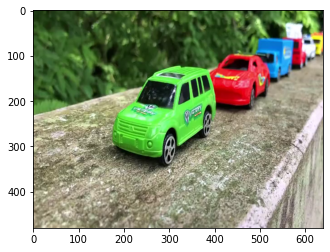

In [8]:
## Display the frame
img_display = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img_display)
plt.show()
     

100%|██████████| 900/900 [00:01<00:00, 593.88it/s]


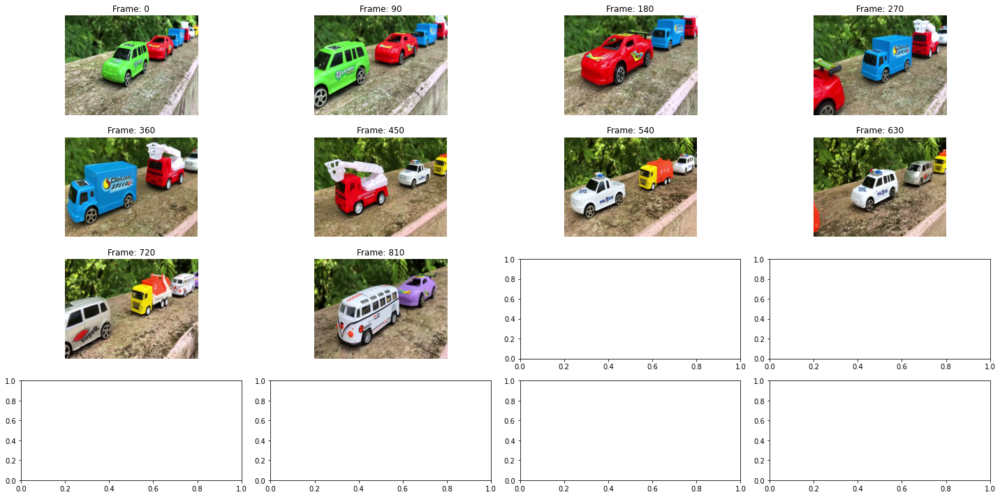

In [9]:
## Display multiple frames at interval of 90 frames
fig, axs = plt.subplots(4, 4, figsize=(20, 10))
axs = axs.flatten()

cap = cv2.VideoCapture(DataFolder + "/toycars.mp4")
total_frame = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
img_idx = 0
for frame in tqdm(range(total_frame)):
    ret, img = cap.read()
    if ret == False:
        break
    if frame % 90 == 0:
        axs[img_idx].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        axs[img_idx].set_title(f'Frame: {frame}')
        axs[img_idx].axis('off')
        img_idx += 1

    frame += 1

plt.tight_layout()
plt.show()
cap.release()
     

###Create the YOLOv5 model

In [10]:
# Import the neccesary libraries
import torch

# Load the Model
model = torch.hub.load('ultralytics/yolov5', 'yolov5s')  

Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2023-3-16 Python-3.9.16 torch-1.13.1+cu116 CPU

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients
Adding AutoShape... 


### Define ```annotate_image()```  

Define a function to take in am RGB image, perform object detection on the image and return the annotated image.

In [18]:
def annotate_image(image):
    
    # perform precidtion
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    results = model(image_rgb) 

    counter = 0    
    for i in range(len(results.pandas().xyxy[0].name)):
      name = results.pandas().xyxy[0].name[i]
 #    if name == "vehicle"
      if name  in ['car','truck','bus']:
        counter += 1

        startX = int(results.pandas().xyxy[0].xmin[i])
        startY = int(results.pandas().xyxy[0].ymin[i])
        endX = int(results.pandas().xyxy[0].xmax[i])
        endY = int(results.pandas().xyxy[0].ymax[i])
        confidence = results.pandas().xyxy[0].confidence[i]
        label = "{}: {:.2f}%".format(name, confidence * 100)
        if confidence > 0.6:
          cv2.rectangle(image, (startX, startY), (endX, endY),
                  (255,0,0), 2)
          y = startY - 15 if startY - 15 > 15 else startY + 15
          cv2.putText(image, label, (startX, y),
            cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0,0,0), 2)
          cv2.putText(image, "Number detected: " +str(counter), (10, 20),
            cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0,0,0), 2)
    
    return image    

## Test the ```annotate_image()```

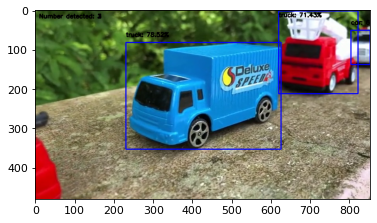

In [19]:
image = cv2.imread(DataFolder + '/Testshot01.jpg')
ann_image = annotate_image(image)

image_display = cv2.cvtColor(ann_image, cv2.COLOR_BGR2RGB)
plt.imshow(image_display)
plt.show()

###Process the video file

In [20]:
video_in_file = DataFolder + "/toycars.mp4"
video_out_file = DataFolder + "/out.mp4"

print("[INFO] accessing video stream...")
v_out = None

v_in = cv2.VideoCapture(video_in_file)
total_frame = int(v_in.get(cv2.CAP_PROP_FRAME_COUNT ))

for frame_no in tqdm(range(total_frame), desc="Processing Video..."):

  (grabbed, frame) = v_in.read()

  # if the frame was not grabbed then we've reached the end of
  # the video stream so exit the script
  if not grabbed:
      print("[INFO] no frame read from stream - exiting")
      break
          
  annotated_img = annotate_image(frame)
      
  # check if the video writer is None
  if v_out is None:
      # initialize our video writer
      fourcc = cv2.VideoWriter_fourcc(*"mp4v")
      v_out = cv2.VideoWriter(video_out_file, fourcc, 
                  int(v_in.get(cv2.CAP_PROP_FPS)),
                  (frame.shape[1], frame.shape[0]), True) 

  # write the output frame to disk
  v_out.write(annotated_img)
    
# release the file pointers
print("\n[INFO] cleaning up...")
v_out.release()
v_in.release()

[INFO] accessing video stream...


Processing Video...: 100%|██████████| 900/900 [06:08<00:00,  2.44it/s]


[INFO] cleaning up...


Play the out.mp4 file.

In [21]:
video_mp4 = DataFolder + "/out2.mp4"
!ffmpeg -y -loglevel info -i $video_out_file -vf scale=640:480 $video_mp4

ffmpeg version 4.2.7-0ubuntu0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 9 (Ubuntu 9.4.0-1ubuntu1~20.04.1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-avresample --disable-filter=resample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librsvg --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --e

In [22]:
def show_local_mp4_video(file_name, width=640, height=480):
  import io
  import base64
  from IPython.display import HTML
  video_encoded = base64.b64encode(io.open(file_name, 'rb').read())
  return HTML(data='''<video width="{0}" height="{1}" alt="test" controls>
                        <source src="data:video/mp4;base64,{2}" type="video/mp4" />
                      </video>'''.format(width, height, video_encoded.decode('ascii')))

In [23]:
show_local_mp4_video(video_mp4, width=640, height=480)

Counting Objects

> Source: https://blog.roboflow.com/how-to-count-objects-in-an-image-using-python/



